<font size="+4">`Signal and Audio Processing`</font>

<font size="+3">`Seminar 02: Discrete Fourier Transform. Discrete-time Fourier transform`</font>

<font size="+2">`Maks Nakhodnov & Dmitry Kropotov`</font>

<font size="+2">`Bremen, 2026`</font>

What you will learn from this notebook:

*   **Discrete Fourier Transform (DFT):** How to decompose a signal into frequencies, Fast Fourier Transform (FFT).
*   **Physical meaning of the spectrum:** What frequency bins are, why resolution depends on the recording duration ($T$) and not on the sampling rate ($F_s$).
*   **Aliasing and Spectral Leakage:** Why false frequencies arise, what the Nyquist frequency is, and why the spectrum of a real-valued signal is symmetric.
*   **Convolution Theorems.**

In [1]:
import os
import sys
import time
from functools import partial

import numpy as np
import scipy as sc
import pandas as pd

import sounddevice as sd

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

import plotly.graph_objects as go

from ipywidgets import interact
from IPython.display import Audio, HTML

import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

### `Properties of the DFT`

1. **Linearity**
$$
DFT(\alpha x + \beta y) = \alpha X + \beta Y
$$

2. **Time Shifting**
$$
x[n] \longrightarrow x[n - n_0] \Longrightarrow S[K] \longrightarrow S[k] \times e^{-j \frac{2 \pi}{N}k n_{0}}
$$

3. **Parseval's Theorem**

In the general derivation of Fourier Series, we showed that in closed systems, the norm of a vector remains unchanged when changing the basis. For physical systems, the square of the vector norm is called the **signal energy**. As a consequence:
$$
\sum\limits_{n=0}^{N} |x[n]|^{2} = \sum\limits|X[k]|^{2}
$$

This equality holds not only for finite signals but for all variations we will consider in this course.

4. **Convolution Theorem**

**Definition (Circular convolution of vectors):**
$$h[n] = (f \circledast g)[n] = \sum_{k=0}^{N-1} f[k] \cdot g[(n - k) \;\text{mod}\; N]$$

**Theorem:**
If $h = f \circledast g$, then its DFT is $H[k] = \sqrt{N} F[k] G[k]$.

**Proof:**

From the analysis formula for $h[n]$: 
$$
H[k] = \frac{1}{\sqrt{N}} \sum_{n=0}^{N-1} h[n] e^{-j \frac{2\pi}{N} nk} = \frac{1}{\sqrt{N}} \sum_{n=0}^{N-1} \left( \sum_{m=0}^{N-1} f[m] \cdot g[(n - m) \;\text{mod}\; N] \right) e^{-j \frac{2\pi}{N} nk}
$$

Swap the sums:
    
$$
H[k] = \frac{1}{\sqrt{N}} \sum_{m=0}^{N-1} f[m] \left( \sum_{n=0}^{N-1} g[(n - m) \;\text{mod}\; N]  e^{-j \frac{2\pi}{N} nk}\right)
$$

Substitute the index $l = (n-m) \;\text{mod}\; N$. Due to the cyclic shift and the property of the exponential ($e^{-j \frac{2\pi}{N} k (l+m)} = e^{-j \frac{2\pi}{N} kl} e^{-j \frac{2\pi}{N} km}$):

$$H[k] = \frac{1}{\sqrt{N}} \sum_{m=0}^{N-1} f[m] e^{-j \frac{2\pi}{N} mk} \sum_{l=0}^{N-1} g[l] e^{-j \frac{2\pi}{N} lk}$$   

Thus, we obtain:

$$
H[k] = \sqrt{N} F[k] G[k] \quad \blacksquare
$$

Note that the dual theorem follows immediately from the Convolution Theorem:
$$
h[n] = f[n] g[n] \iff H[k] = \frac{1}{\sqrt{N}}(F\circledast G)[k]
$$

5. **Linear Time-Invariant Systems (LTI)**

A system $\mathcal{H}$ transforming an input signal $x[n]$ into an output $y[n]$ is called an **LTI system** (Linear Time-Invariant) if it satisfies two properties:

1.  **Linearity:** The system obeys the principle of superposition.
    For any signals $x_1[n], x_2[n]$ and any complex constants $a, b$:
    
    $$
    \mathcal{H}\{a x_1[n] + b x_2[n]\} = a \mathcal{H}\{x_1[n]\} + b \mathcal{H}\{x_2[n]\}
    $$

2.  **Stationarity / Time-Invariance:** A shift in the input signal in time leads to an analogous shift in the output signal.
    If $y[n] = \mathcal{H}\{x[n]\}$, then for any shift $n_0$:
    
    $$
    \mathcal{H}\{x[n - n_0]\} = y[n - n_0]
    $$

We discussed that such systems act on a signal via convolution with their **Impulse Response** (show this yourself!).

$$
s[n] \overset{\text{System H action}}{\longrightarrow} y[n] = (s * h)[n] = \sum\limits_{k=0}^{N-1} s[k]h[n - k]
$$

<b style='color:red;'>Why do we choose a basis of complex exponentials instead of triangles or square waves?</b>
<details><summary>Answer:</summary>
The complex exponential $e^{j\omega n}$ is an <b>eigenfunction</b> of any Linear Time-Invariant (LTI) system.
If a harmonic of frequency $w$ is fed into an LTI system (e.g., our RL circuit or a room with echo), the output will be <b>the same harmonic with the same frequency</b>, only its amplitude and phase will change. This incredibly simplifies calculations: instead of solving differential equations (convolutions), we switch to ordinary multiplication by a complex number (the system's gain coefficient).
    
Let us show that for the convolution operator (LTI system), the eigenfunctions are complex exponentials of the form $x[n] = e^{j\omega n}$.

Assume that a signal is fed to the input of an LTI system with impulse response $h[n]$:
$$
x[n] = e^{j\omega n} \quad (\text{where } -\infty < n < \infty)
$$

Calculate the output $y[n]$ using the definition of convolution:
$$
y[n] = \sum_{k=-\infty}^{\infty} h[k] x[n-k]
$$

Substitute $x[n-k]$:
$$
y[n] = \sum_{k=-\infty}^{\infty} h[k] e^{j\omega(n - k)}
$$

Factor out the term depending on $n$ from the summation:
$$
y[n] = \sum_{k=-\infty}^{\infty} h[k] e^{j\omega n} e^{-j\omega k} = e^{j\omega n} \underbrace{\left( \sum_{k=-\infty}^{\infty} h[k] e^{-j\omega k} \right)}_{H(e^{j\omega})}
$$

Let us denote the expression in parentheses as $H(e^{j\omega})$:
$$
y[n] = H(e^{j\omega}) \cdot e^{j\omega n}
$$

Or in terms of eigenvectors:
$$
\mathcal{H}\{e^{j\omega n}\} = \lambda \cdot e^{j\omega n}, \quad \text{where } \lambda = H(e^{j\omega})
$$

$\blacksquare$

</details>

Moreover, calculation of convolution can be translated into calculation of the product of spectra:

$$(x \circledast h)[n] = \sum_{k=0}^{N-1} x[k] \cdot h[(n - k) \;\text{mod}\; N] \longleftrightarrow IDFT\Bigg[X[k] \cdot H[k]\Bigg]$$

<b style='color:red;'>Note, here we learned to calculate the so-called **circular convolution**, not **linear convolution**.</b> Using this approach directly will lead to incorrect results due to **time aliasing**; however, the problem can be easily solved (think about how?!). 

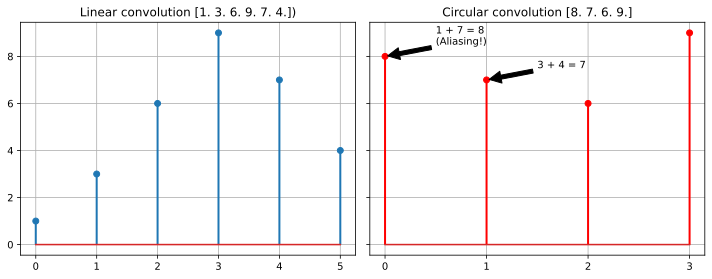

In [2]:
x = np.array([1.0, 2.0, 3.0, 4.0])
h = np.array([1.0, 1.0, 1.0])

# Linear Convolution. Length: 4 + 3 - 1 = 6
y_linear = np.convolve(x, h, mode='full')

# Circular Convolution. Length is the length of the longest signal (N=4)
N = max(len(x), len(h))
X = np.fft.fft(x, n=N)
H = np.fft.fft(h, n=N)
y_circular = np.fft.ifft(X * H).real

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

# Linear convolution plot
markerline, stemlines, baseline = axes[0].stem(y_linear)
plt.setp(stemlines, 'linewidth', 2)
axes[0].set_title(f'Linear convolution {y_linear})')
axes[0].set_xticks(range(len(y_linear)))
axes[0].grid(True)

# Circular convolution plot
markerline, stemlines, baseline = axes[1].stem(y_circular, linefmt='r', markerfmt='ro')
plt.setp(stemlines, 'linewidth', 2)
axes[1].set_title(f'Circular convolution {y_circular}')
axes[1].set_xticks(range(N))
axes[1].grid(True)

# The tail of the linear convolution (indices 4 and 5) "wrapped around" to the beginning
# y_lin[4] = 7 -> added to y_lin[0]=1 -> result 8
# y_lin[5] = 4 -> added to y_lin[1]=3 -> result 7
axes[1].annotate(
    '1 + 7 = 8\n(Aliasing!)', xy=(0, 8), xytext=(0.5, 8.5),
    arrowprops=dict(facecolor='black', shrink=0.05)
)
axes[1].annotate(
    '3 + 4 = 7', xy=(1, 7), xytext=(1.5, 7.5),
    arrowprops=dict(facecolor='black', shrink=0.05)
)

plt.tight_layout()
plt.show()

In [3]:
from plt_utils import animate_aliasing_fixed

anim = animate_aliasing_fixed()
display(HTML(anim.to_jshtml()))

The main benefit of switching to the frequency domain is that we can now calculate convolution faster than $\mathcal{O}(N^{2})$ — in three DFT/IDFT calculations.

### `Fast Fourier Transform`

**Problem:**
Calculating DFT "directly" via matrix multiplication requires $N^2$ operations. This is too slow for real-time processing.

**Solution:**
In 1965, James Cooley and John Tukey developed an algorithm that uses the symmetry of complex exponentials to reduce the number of operations to $N \log N$.

#### `Cooley-Tukey Algorithm (Decimation in Time)`

Assume the signal length is a power of two. Apply the "Divide and Conquer" idea: split the original DFT sum into two smaller sums — for even and odd indices.

Write the DFT definition:
$$
S[k] = \frac{1}{\sqrt{N}}\sum\limits_{n=0}^{N-1} s[n] e^{-j\frac{2\pi}{N}kn} = \frac{1}{\sqrt{N}}\sum\limits_{n=0}^{N-1} s[n] W_N^{nk}
$$

Split the sum into even ($n=2m$) and odd ($n=2m+1$) elements:
$$
S[k] = \frac{1}{\sqrt{N}}\sum_{m=0}^{N/2-1} s[2m] W_N^{2mk} + \frac{1}{\sqrt{N}}\sum_{m=0}^{N/2-1} s[2m+1] W_N^{(2m+1)k}
$$

By the property of the exponential, the **twiddle factor** can be reduced to a smaller parameter $N$.

$$
S[k] = \frac{1}{\sqrt{N}}\sum_{m=0}^{N/2-1} s[2m] W_{N/2}^{mk} + W_N^k \frac{1}{\sqrt{N}}\sum_{m=0}^{N/2-1} s[2m+1] W_{N/2}^{mk} = E[k] + W_N^k O[k]
$$

Note that $E[k]$ and $O[k]$ are periodic with period $N / 2$ as the DFT of the even and odd parts of the signal elements.

Then:

$$
S[k + N / 2] = E[k + N / 2] + W_N^{k + N / 2} O[k + N / 2] = E[k] + W_N^{N / 2} W_N^k O[k] = \{e^{-j\frac{2\pi}{N}N/2} = -1\} = E[k] - W_N^k O[k]
$$

**"Butterfly" Operation:**
We found that to calculate two values ($X[k]$ and $X[k+N/2]$), we need to calculate $E[k]$ and $O[k]$ only **once**, and then simply add and subtract them with the weight $W_N^k$.

$$
\begin{cases}
X[k] &= E[k] + W_N^k O[k] \\
X[k + N/2] &= E[k] - W_N^k O[k]
\end{cases}
$$

Thus, if $T(N)$ is the cost of computing FFT for a sequence of length $N$, then:
$$
T(N) = 2 * T(N / 2) + \mathcal{O}(N) \Longrightarrow \{\text{Master theorem}\} \Longrightarrow T(N) = \mathcal{O}(N\log N)
$$

#### `Visualization of the Computation Graph (Butterfly)`

Let's build a graph for $N=8$ to see how the data intertwines.

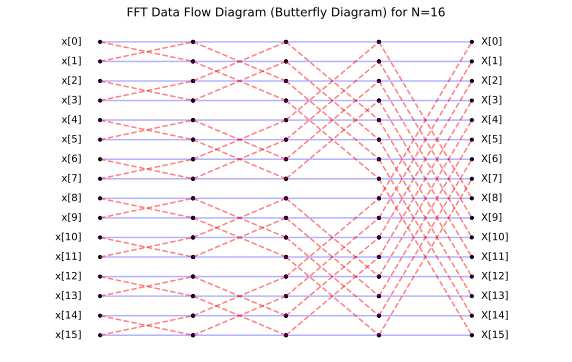

In [4]:
def draw_fft_butterfly(N=8):
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlim(-1, np.log2(N) + 1)
    ax.set_ylim(-1, N)
    ax.axis('off')
    
    stages = int(np.log2(N))
    
    y_pos = np.arange(N)[::-1]
    
    for stage in range(stages):
        x_curr = stage
        x_next = stage + 1
        
        group_size = 2 ** (stage + 1)
        half_size = group_size // 2
        
        for i in range(0, N, group_size):
            for k in range(half_size):
                top_idx = i + k
                bot_idx = i + k + half_size
                
                y_top = y_pos[top_idx]
                y_bot = y_pos[bot_idx]
                
                ax.plot([x_curr, x_next], [y_top, y_top], 'b-', alpha=0.3)
                ax.plot([x_curr, x_next], [y_bot, y_bot], 'b-', alpha=0.3)
                ax.plot([x_curr, x_next], [y_top, y_bot], 'r--', alpha=0.5)
                ax.plot([x_curr, x_next], [y_bot, y_top], 'r--', alpha=0.5)
                
                # Точки
                ax.scatter([x_curr, x_next], [y_top, y_top], c='k', s=10)
                ax.scatter([x_curr, x_next], [y_bot, y_bot], c='k', s=10)

    for i in range(N):
        ax.text(-0.2, y_pos[i], f'x[{i}]', ha='right', va='center')
        ax.text(stages + 0.1, y_pos[i], f'X[{i}]', ha='left', va='center')
        
    ax.set_title(f"FFT Data Flow Diagram (Butterfly Diagram) for N={N}")
    plt.show()

draw_fft_butterfly(16)

Blue lines represent addition, red dashed lines represent subtraction (multiplied by $W$). It is visible that every output depends on all inputs, but the connections are strictly structured.

<b style='color:red;'>But what if the signal length is not a power of two?</b>
<details><summary>Answer:</summary> There are several answers:
<ul>
<li>Discard samples down to a power of two $\Rightarrow$ information loss.</li>
<li>Pad with zeros up to a power of two $\Rightarrow$ we get values of an interpolated spectrum, not the exact one needed.</li>
<li>If the length can be factorized, a non-binary equivalent of the Cooley-Tukey algorithm can be used.</li>
<li>For prime lengths $\Rightarrow$ Bluestein's Algorithm.</li>
</ul>
</details>

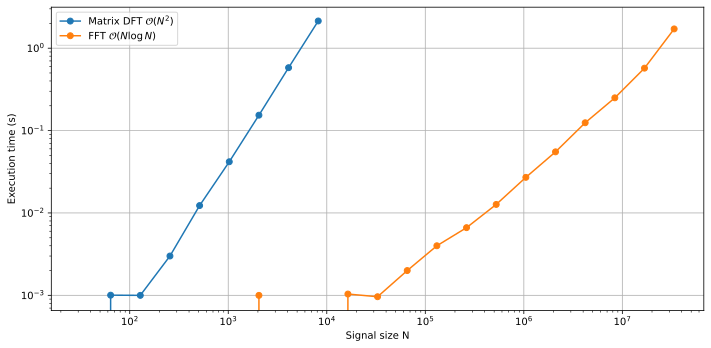

In [5]:
def dft_slow_matrix(s):
    N = len(s)
    M = 1 / np.sqrt(N) * np.exp(-1j * 2 * np.pi / N * np.arange(N)[:, None] * np.arange(N)[None, :])
    return s @ M.conjugate()

Ns_fast, times_fast = 2 ** np.arange(5, 26), []
for N in Ns_fast:
    s = np.random.random(N) + 1j * np.random.random(N)
    
    start = time.time()
    np.fft.fft(s)
    times_fast.append(time.time() - start)
    
Ns_slow, times_slow = 2 ** np.arange(5, 14), []
for N in Ns_slow:
    s = np.random.random(N) + 1j * np.random.random(N)
    
    start = time.time()
    dft_slow_matrix(s)
    times_slow.append(time.time() - start)

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(Ns_slow, times_slow, 'o-', label='Matrix DFT $\mathcal{O}(N^2)$')
ax.plot(Ns_fast, times_fast, 'o-', label='FFT $\mathcal{O}(N \log N)$')

ax.set_xlabel('Signal size N')
ax.set_ylabel('Execution time (s)')

ax.legend()
ax.grid(True)
ax.set_xscale('log')
ax.set_yscale('log')

fig.tight_layout()
plt.show()

### `Geometric Meaning of Coefficients`

Let's consider the geometric meaning of DFT coefficients. Since by definition the $k$-th coefficient in the new basis is determined as a scalar projection: $s^{w}_{k} = \langle s^{\delta}, w_{k} \rangle$. The coefficient shows how much of the $k$-th harmonic is contained in the signal.

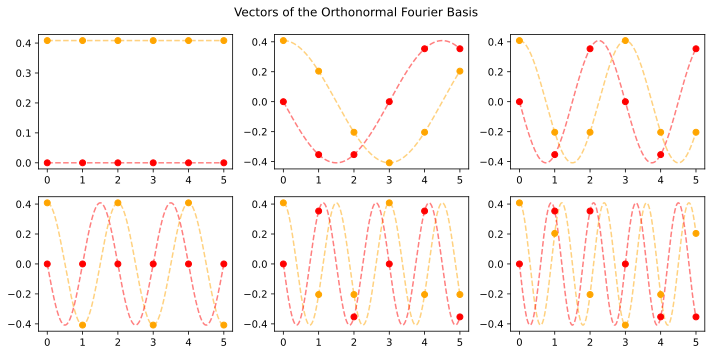

In [6]:
N = 6
M = 1 / np.sqrt(N) * np.exp(-1j * 2 * np.pi / N * np.arange(N)[:, None] * np.arange(N)[None, :])

fig, axes = plt.subplots(2, 3, figsize=(10, 5))

for ax, k in zip(axes.reshape(-1), range(N)):
    xs = np.linspace(0, N - 1, 1000)
    ys = 1 / np.sqrt(N) * np.cos(-2 * np.pi / N * k * xs)
    ax.plot(xs, ys, '--', color='orange', alpha=0.5)
    
    xs = np.linspace(0, N - 1, 1000)
    ys = 1 / np.sqrt(N) * np.sin(-2 * np.pi / N * k * xs)
    ax.plot(xs, ys, '--', color='red', alpha=0.5)
    
    ax.scatter(np.arange(N), M[k].real, color='orange', zorder=100)
    ax.scatter(np.arange(N), M[k].imag, color='red', zorder=100)

fig.suptitle('Vectors of the Orthonormal Fourier Basis')
fig.tight_layout()
plt.show()

In [7]:
N, w = 6, 1.60
n_indices = np.arange(N)
ts = np.linspace(0.0, np.pi, N)
ts_fine = np.linspace(0, N - 1, 200)

M = 1 / np.sqrt(N) * np.exp(-1j * 2 * np.pi / N * n_indices[:, None] * n_indices[None, :])

signal = lambda t: np.sin(w * t)
sn = signal(ts)
Sw = sn @ M.conjugate()

In [8]:
fig = go.Figure()
colors = plt.get_cmap('tab10')

final_signal_fine = np.zeros_like(ts_fine, dtype=complex)
for k in range(N):
    helix_fine = Sw[k] * (1 / np.sqrt(N)) * np.exp(-1j * 2 * np.pi / N * k * ts_fine)
    final_signal_fine += helix_fine
    
    fig.add_trace(go.Scatter3d(
        x=ts_fine, y=helix_fine.real, z=helix_fine.imag,
        mode='lines',
        name=f'k={k} ($|w_{k}|={np.abs(Sw[k]):.2f})$',
        line=dict(width=4, color=matplotlib.colors.rgb2hex(colors(k))),
    ))

fig.add_trace(go.Scatter3d(
    x=n_indices, y=sn, z=np.zeros_like(sn),
    mode='markers',
    name='Original points sn',
    marker=dict(color='red', size=6, symbol='circle')
))
fig.add_trace(go.Scatter3d(
    x=ts_fine, y=final_signal_fine.real, z=final_signal_fine.imag,
    mode='lines',
    name='Summed signal',
    line=dict(color='black', width=5)
))
fig.add_trace(go.Scatter3d(
    x=ts_fine, y=signal(np.linspace(0.0, np.pi, ts_fine.shape[0])), z=np.zeros_like(ts_fine),
    mode='lines',
    name='Original signal s(x)',
    line=dict(color='red', width=3, dash='dash'),
))

fig.update_layout(
    title="Fourier Decomposition",
    scene=dict(
        xaxis_title='Time (n)',
        yaxis_title='Real (Amplitude)',
        zaxis_title='Imag (Phase)',
        aspectmode='manual',
        aspectratio=dict(x=2, y=1, z=1)
    ),
    margin=dict(l=0, r=0, b=0, t=40),
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01)
)

fig.show()

In [9]:
fig = go.Figure()
colors = plt.get_cmap('tab10')

total_reconstruction_fine = np.zeros(len(ts_fine))
for k in range(N):
    helix_fine = Sw[k] * (1 / np.sqrt(N)) * np.exp(-1j * 2 * np.pi / N * k * ts_fine)
    harmonic_points = Sw[k] * (1 / np.sqrt(N)) * np.exp(-1j * 2 * np.pi / N * k * n_indices)
    
    total_reconstruction_fine += helix_fine.real
    
    fig.add_trace(go.Scatter3d(
        x=ts_fine, y=np.full_like(ts_fine, k), z=helix_fine.real,
        mode='lines',
        name=f'Harmonic k={k}',
        line=dict(color=matplotlib.colors.rgb2hex(colors(k)), width=3),
        opacity=0.5
    ))
    fig.add_trace(go.Scatter3d(
        x=n_indices, y=np.full_like(n_indices, k), z=harmonic_points.real,
        mode='markers',
        name=f'Harmonic samples k={k}',
        marker=dict(color=matplotlib.colors.rgb2hex(colors(k)), size=4, symbol='diamond'),
        showlegend=False
    ))
    
fig.add_trace(go.Scatter3d(
    x=ts_fine, y=np.full_like(ts_fine, N + 1), z=total_reconstruction_fine,
    mode='lines',
    name='Reconstruction',
    line=dict(color='black', width=5)
))
fig.add_trace(go.Scatter3d(
    x=n_indices, y=np.full_like(n_indices, N + 1), z=sn,
    mode='markers',
    name='Samples $s[n]$',
    marker=dict(color='red', size=6, symbol='circle')
))
fig.add_trace(go.Scatter3d(
    x=ts_fine, y=np.full_like(ts_fine, N + 1), z=signal(np.linspace(0.0, np.pi, ts_fine.shape[0])),
    mode='lines',
    name='Original signal s(x)',
    line=dict(color='red', width=3, dash='dash'),
))

fig.update_layout(
    title="Basis vectors and their sum",
    scene=dict(
        xaxis_title='Time (n)',
        yaxis_title='Index k',
        zaxis_title='Real (Amplitude)',
        aspectratio=dict(x=2, y=2, z=1),
        camera=dict(eye=dict(x=1.8, y=1.2, z=0.8))
    ),
    margin=dict(l=0, r=0, b=0, t=50)
)

fig.show()

Note that in this way, the Fourier Transform determines exactly how to stretch and shift the periodic components of the basis relative to each other to obtain the original signal. At the same time, the points at $n=0$ on each plane are at different heights. This is the visualization of the phase: each wave is shifted relative to the others.

Such a representation shows the potential benefit of analysis in frequency space — we can operate on individual components of the signal, for example, removing high/low frequencies from sound, or applying filters that act only on a part of the spectrum.

### `Physical Meaning of Frequency Bins`

Each DFT coefficient is a "filter" isolating a specific frequency band. In particular, the $k$-th coefficient shows how much of the corresponding harmonic is in the signal, where the **digital frequency** of this harmonic is defined as $\Omega_{k} = \frac{2\pi}{N} k$ [radians/sample]. This means that this harmonic makes $k$ full cycles around the circle over the full signal duration of $N$ samples.

Let's switch to the physical signal. Such a signal is defined by the sampling rate $F$ [Hz]. The sampling rate establishes a connection between samples and time: $t = n \Delta t = n \frac{1}{F} \Rightarrow n = t F$. Substitute into the expression for the $k$-th harmonic:
$$
\frac{1}{\sqrt{N}}e^{-j\frac{2\pi}{N}nk} = \frac{1}{\sqrt{N}}e^{-j\Big(\frac{2\pi k}{N}F\Big)t} = \frac{1}{\sqrt{N}}e^{-j2\pi f_{k}t} \Longrightarrow f_{k} = k \frac{F}{N} \text{[Hz]}
$$

**Physical frequency** determines how many cycles the harmonic makes per second.

As a result of the DFT, we get $N$ complex numbers, each of which determines a specific bin frequency (**physical frequency**). Assume that the duration of this signal is $T$ seconds. Then:
$$
f_{k} = \frac{k}{T} \Rightarrow \Delta f = \frac{1}{T} \text{[Hz]}
$$

sets the **frequency resolution**. The most important conclusion from the formula $\Delta f = \frac{1}{T}$ is that **the ability to distinguish close frequencies depends exclusively on the recording time, and not on the sampling rate.**

Example:

*   **Analysis:** If the signal contains two notes with frequencies $10$ Hz and $11$ Hz (difference $1$ Hz), then to see them as two separate peaks, we need an observation window $T \ge 1$ second. 
*   **Practical limitation:** If we take a window that is too short (e.g., $0.1$ sec), the resolution will be only $10$ [Hz]. These two notes will merge into one wide "bin". We cannot increase accuracy simply by increasing $F$ (points per second) — we need to listen to the signal for longer.

Sometimes there is a temptation to artificially increase $N$ by simply adding a chain of zeros to the end of the signal (Zero-padding). Mathematically, the frequency grid will become denser, and the spectrum graph will look smoother and nicer. However, new details will not appear in the spectrum. If during the observation time $T$ two frequencies did not manage to "diverge" in phase enough for the DFT to separate them, then no mathematical processing after recording will separate them. What happens during Zero-padding will be discussed in the next section.

In [10]:
signal = lambda t: np.sin(2 * np.pi * 10 * t) + np.sin(2 * np.pi * 11 * t)

def plot_02(T=10, F=30):
    N = T * F
    M = 1 / np.sqrt(N) * np.exp(-1j * 2 * np.pi / N * np.arange(N)[:, None] * np.arange(N)[None, :])
    sn = signal(np.arange(N) / F)

    fig, axes = plt.subplots(1, 3, figsize=(10, 4))
    axes[0].plot(sn, '--', color='orange', alpha=0.3)
    axes[0].plot(sn, 'o', color='blue')
    
    magnitude = np.absolute(sn @ M.conjugate())
    phase = np.angle(sn @ M.conjugate())
    phase[magnitude < 1e-10] = 0

    axes[1].plot(np.linspace(0.0, F, len(sn)), phase, 'o', color='blue')
    axes[2].plot(np.linspace(0.0, F, len(sn)), magnitude, 'o', color='blue')

    axes[0].set_title(r'$s[n]$')
    axes[1].set_title(r'$Arg(s[w])$')
    axes[2].set_title(r'$Abs(s[w])$')

    fig.tight_layout()
    plt.show()
    
interact(plot_02);

interactive(children=(IntSlider(value=10, description='T', max=30, min=-10), IntSlider(value=30, description='…

<b style='color:red;'>However, what is happening with the spectrum, why is it symmetric?!</b>

### `Spectral Symmetry. Aliasing`

Assume the signal is real-valued, e.g., sound. In this case, one can notice (try to prove it yourself!) that:
$$
s^{w}_{k} = \overline{s^{w}_{N-k}}
$$

This means that for any real-valued signal, information in the spectrum is duplicated:

In [11]:
N, w = 21, 1.60
M = 1 / np.sqrt(N) * np.exp(-1j * 2 * np.pi / N * np.arange(N)[:, None] * np.arange(N)[None, :])
sn = signal(np.linspace(0.0, np.pi, N))
Sw = sn @ M.conjugate()

Sw[0].imag == 0, np.absolute(Sw[np.arange(1, N)] - Sw[N - np.arange(1, N)].conjugate()).sum()

(True, 8.601126033527797e-14)

Intuitively, the symmetry property arises because for a real-valued signal, it is necessary to compensate for complex terms in the basis expansion.

Practically, this means that the amplitude spectrum is symmetric, and the phase spectrum is antisymmetric:
$$
|s^{w}_{k}| = |s^{w}_{N-k}|, \angle s^{w}_{k} = -\angle s^{w}_{N-k}
$$

It follows from this that when conducting frequency analysis, it is impossible to learn additional information about any frequencies above $F / 2$ (**Nyquist Frequency**). These frequencies $F / 2 + f$ will be indistinguishable from $F / 2 - f$. 

Similarly, since the basis is periodic with frequency $F$, all frequencies $F + f$ in the original signal will map to low frequencies $f$.

Example: $T = 1$ [s], $F = 100$ [Hz]. Assume the signal contains frequencies $20$ [Hz], $60$ [Hz], $125$ [Hz].

Then in the DFT spectrum, we will see frequencies:
1. From frequency $20$ [Hz], a mirror $80$ [Hz] will be added.
2. From frequency $60$ [Hz], a mirror $40$ [Hz] will be added.
3. From frequency $125$ [Hz], $25$ [Hz] will be added due to periodicity and a mirror $75$ [Hz].

Periodic and mirrored frequencies in the original signal can overlap and interfere, both positively and negatively, which complicates frequency analysis of the signal.

In [12]:
signal = lambda t: np.sin(2 * np.pi * 20 * t) + np.sin(2 * np.pi * 60 * t) + np.sin(2 * np.pi * 125 * t)

def plot_03(T=2, F=100):
    N = T * F
    M = 1 / np.sqrt(N) * np.exp(-1j * 2 * np.pi / N * np.arange(N)[:, None] * np.arange(N)[None, :])
    sn = signal(np.arange(N) / F)

    fig, axes = plt.subplots(1, 3, figsize=(10, 4))
    axes[0].plot(sn, '--', color='orange', alpha=0.3)
    axes[0].plot(sn, 'o', color='blue')
    
    magnitude = np.absolute(sn @ M.conjugate())
    phase = np.angle(sn @ M.conjugate())
    phase[magnitude < 1e-10] = 0
    
    axes[1].plot(np.linspace(0.0, F, len(sn)), phase, 'o', color='blue')
    axes[2].plot(np.linspace(0.0, F, len(sn)), magnitude, 'o', color='blue')

    axes[0].set_title(r'$s[n]$')
    axes[1].set_title(r'$Arg(s[w])$')
    axes[2].set_title(r'$Abs(s[w])$')

    fig.tight_layout()
    plt.show()
    
interact(plot_03);

interactive(children=(IntSlider(value=2, description='T', max=6, min=-2), IntSlider(value=100, description='F'…

Due to the aliasing effect, we found that if the signal contains frequencies up to $f_{max}$, we can guarantee their determination only by choosing a sampling rate $F > 2 * f_{max}$. It turns out that this statement is also true in reverse:

**Nyquist-Shannon Sampling Theorem:** If an analog signal $s(t)$ has a limited spectrum containing no frequencies higher than $f_{max}$, then this signal can be completely and unambiguously reconstructed from its discrete samples taken with frequency $F > 2 f_{max}$.

We already see the intuition behind this theorem, but to prove it strictly, we need to switch to the theory of continuous signals.

### `Summary`

Thus, the result of the DFT $S[k]$ is usually interpreted as follows:

1. **$S[0]$ (DC Component):** Sum of all signal samples. This is the "direct current" component or average value. If the mean is subtracted from the signal (centering), $S[0]$ becomes 0.
2. **Bins $1 \dots \frac{N}{2}-1$:** Positive frequencies.
3. **Bin $\frac{N}{2}$ (Nyquist Bin):** The highest frequency we can capture. A signal of the form $[1, -1, 1, -1 \dots]$.
4. **Bins $\frac{N}{2}+1 \dots N-1$:** Negative frequencies (in the case of a real signal — a mirror image of positive ones).

DFT returns spectrum values on a discrete frequency grid:
$$
f_k = k\frac{F}{N} 
$$

Each spectral bin corresponds not to a point frequency,
but to a **band of width**
$$
\Delta f = \frac{F}{N}
$$

Thus, DFT can be interpreted as a filter bank, each of which integrates signal energy in its frequency band.

**There are different conventions for DFT scaling.**

The most common options:
1. Scaling $1/N$ in the inverse transform (numpy, MATLAB).
2. Symmetric scaling $1/\sqrt{N}$ in both forward and inverse transforms.

The choice of normalization **does not affect the physical meaning of the spectrum**,
but affects:
- amplitude values,
- Parseval's formula,
- convenience of analytical derivations.

## $L^{2}[a, b]$ `(Finite/Periodic functions of a continuous argument)`

Now, let's consider the case where the original signal is analog but on a finite interval. We have already discussed that any discrete signal can be considered as a restriction of the support of an analog signal. However, it is often more convenient to analyze the properties of discrete signals through their continuous extension.

Unlike the discrete case, in $L^2[a,b]$ there is no **finite** basis. However, it is known that any *separable* Hilbert space has a countable basis. In particular, for $L^2[a,b]$, this is proven by the **Riesz-Fischer Theorem**.

This fact suggests that an uncountable, temporal representation is fundamentally not natural. Although signals can be represented through decomposition over a continuum of functions, such a representation is not of particular practical interest. One can consider a representation that can be considered natural $s(t) = \int\limits_{a}^{b} \delta(t - x) s(x) dx$ — this is a generalization of Fourier Series to the case of generalized functions; however, such an approach would make more sense for functions with unbounded support.

Let's consider an example of a countable basis (which will be a constructive proof of the Riesz-Fischer Theorem).

Without loss of generality, consider the interval $[a, b]: a = 0, b = T$.

A simple and physically natural system of functions consists of complex exponentials:
$$
b_{n}(t) = \frac{1}{\sqrt{T}} e^{-j\frac{2\pi}{T}nt}, n \in \mathbb{Z}
$$

The orthonormality of this system is obvious. Separately, one can show the completeness of this system, which guarantees that the system is a basis in this space.

Note that since this basis is periodic with period $T$, the Fourier Series will converge not only on $[0, T]$, but on the entire space to the periodic extension of this signal. Similar to the DFT, we erase the distinction between periodic and finite signals.

<table style="border-collapse:collapse;border-spacing:0" class="tg"><thead><tr><th style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Signal</th><th style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Transformation</th><th style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Analysis</th><th style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Synthesis</th></tr></thead>
<tbody><tr><td style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Finite/Periodic (continuous support) $$s(t)\in L^{2}[a, b]$$</td><td style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Fourier series in $L^{2}[a, b]$</td><td style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">$$S_n = \frac{1}{\sqrt{T}} \int_a^b s(t) e^{-j \frac{2\pi}{T}nt} \, dt$$</td><td style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:right;vertical-align:top;word-break:normal">$$s(t) = \frac{1}{\sqrt{T}} \sum_{n=-\infty}^{\infty} S_n e^{j \frac{2\pi}{T}nt}$$</td></tr></tbody></table>

Just as before, the product of coefficients before the formulas should be $\frac{1}{T}$, and the minus sign in the exponent can stand in exactly one of the two formulas.

An attentive listener might notice the similarity between the basis functions in $L^2[a,b]$ and the basis vectors in $\mathbb{C}^{N}$:

$$
\frac{1}{\sqrt{T}} e^{-j\frac{2\pi}{T}nt} \Longleftrightarrow \frac{1}{\sqrt{N}} e^{-j\frac{2\pi}{N}nk}
$$

If we assume that the interval $[0, T]$ contains exactly $N$ equally spaced samples by $\Delta t$, we get $N \Delta t = T$, $k\Delta t = t_{k}$:
$$
w_{n}^{(k)} = \frac{1}{\sqrt{N}} e^{-j\frac{2\pi}{N}nk} = \frac{1}{\sqrt{T}} e^{-j\frac{2\pi}{T}nt_{k}} \sqrt{\Delta t} = b_n(t_{k})\sqrt{\Delta t} 
$$

That is, the basis harmonics of the DFT are discretizations of the harmonics of the continuous countable basis!

In [13]:
def plot_03(N=3, n_max=6, T=1.0):
    fig, axes = plt.subplots(n_max // 3, 3, figsize=(10, 2 * n_max // 3))

    for ax, n in zip(axes.reshape(-1), range(n_max)):
        ts = np.linspace(0.0, T, 1000)
        harmonic = 1 / np.sqrt(T) * np.exp(-1.0j * 2 * np.pi / T * n * ts)

        dt = T / N
        t_is = np.arange(N) * dt
        dft_harmonic = 1 / np.sqrt(T) * np.exp(-1.0j * 2 * np.pi / T * n * t_is)

        ax.plot(ts, harmonic.real, '--', color='orange', alpha=0.5)
        ax.plot(ts, harmonic.imag, '--', color='red', alpha=0.5)

        ax.scatter(t_is, dft_harmonic.real, color='orange', zorder=100)
        ax.scatter(t_is, dft_harmonic.imag, color='red', zorder=100)

    fig.suptitle('Vectors of the Orthonormal Fourier Basis')
    fig.tight_layout()
    plt.show()
    
interact(plot_03);

interactive(children=(IntSlider(value=3, description='N', max=9, min=-3), IntSlider(value=6, description='n_ma…

### $s(t) = sin(wt)$

Consider the Fourier Series for some standard function:
$$
s(t) = \sin(wt) \Rightarrow s_{n} = \int_{0}^{T} \sin(wt) \frac{1}{\sqrt{T}} e^{j\frac{2\pi}{T}nt}dt = \frac{1}{2j\sqrt{T}} \int_{0}^{T}[e^{jwt(1+n)} - e^{jwt(-1+n)}]dt =\\= \{n \ne \pm 1\} = \frac{1}{2j\sqrt{T}} \Bigg[\frac{e^{jwt(1+n)}}{jw(1+n)} - \frac{e^{jwt(-1+n)}}{jw(-1+n)}\Bigg]_0^{T} = 0
$$


$$
n = \pm 1 \Rightarrow s_{n} = \frac{1}{2j\sqrt{T}} \int_{0}^{T}[\mp 1 + e^{\pm j2wt}]dt = \frac{1}{2j\sqrt{T}}\Bigg[\mp t + \frac{e^{\pm j2wt}}{\pm j2w}\Bigg]_0^T = \frac{1}{2j\sqrt{T}} \Bigg[\mp T + \frac{1}{\pm j2w} - \frac{1}{\pm j2w}\Bigg] = \mp\frac{\sqrt{T}}{2j} = \pm\frac{\sqrt{T}j}{2}
$$

It can be verified that this expression is correct by substituting the corresponding coefficients into the Fourier Series.

In [14]:
N, w = 2, 1.0
T = 2 * np.pi / w
ts = np.linspace(-T, 2 * T, 1000)

signal = lambda t: np.sin(w * t)
s_ns = {
    -1: -1.0j * np.sqrt(T) / 2,
    1: 1.0j * np.sqrt(T) / 2,
}

In [15]:
fig = go.Figure()
colors = plt.get_cmap('tab10')

total_reconstruction_fine = np.zeros(len(ts), dtype=np.complex128)
for n in range(-N, N + 1):
    helix_fine = s_ns.get(n, 0.0) * (1 / np.sqrt(T) * np.exp(-1.0j * 2 * np.pi / T * n * ts))
    total_reconstruction_fine += helix_fine
    
    fig.add_trace(go.Scatter3d(
        x=ts, y=np.full_like(ts, n), z=helix_fine.real,
        mode='lines',
        name=f'Harmonic k={n}',
        line=dict(color=matplotlib.colors.rgb2hex(colors(2 * n - 1 if n > 0 else -2 * n)), width=3),
        opacity=0.5
    ))
    
fig.add_trace(go.Scatter3d(
    x=ts, y=np.full_like(ts, N + 1), z=total_reconstruction_fine.real,
    mode='lines',
    name='Reconstruction',
    line=dict(color='black', width=5)
))
fig.add_trace(go.Scatter3d(
    x=np.linspace(0.0, T, ts.shape[0]), y=np.full_like(ts, N + 1), z=signal(np.linspace(0.0, T, ts.shape[0])),
    mode='lines',
    name='Original signal s(x)',
    line=dict(color='red', width=15, dash='dash'),
))

fig.update_layout(
    title="Basis vectors and their sum",
    scene=dict(
        xaxis_title='Time (n)',
        yaxis_title='Index k',
        zaxis_title='Real (Amplitude)',
        aspectratio=dict(x=2, y=2, z=1),
        camera=dict(eye=dict(x=1.8, y=1.2, z=0.8))
    ),
    margin=dict(l=0, r=0, b=0, t=50)
)

fig.show()

### $s(t) = t$

A slightly more complex example:

$$
s(t) = t \Rightarrow s_{n} = \{n \ne 0\} = \int_{0}^{T} t \frac{1}{\sqrt{T}} e^{jwnt}dt = \frac{1}{\sqrt{T}} t \frac{e^{jwnt}}{jwn} \Bigg|_{0}^{T} - \frac{1}{\sqrt{T}} \int_{0}^{T}\frac{e^{jwnt}}{jwn}dt = \frac{\sqrt{T}}{jwn} - \frac{1}{\sqrt{T}(wn)^{2}} e^{jwnt}\Bigg|_{0}^{T} = -\frac{jT^{3/2}}{2\pi n}
$$
$$
n = 0 \Rightarrow s_{0} = \frac{1}{\sqrt{T}} \int_{0}^{T} tdt = \frac{T^{3/2}}{2}
$$

Total:
$$
s(t) = t = \frac{T^{3/2}}{2} \frac{1}{\sqrt{T}} - \sum_{n\ne0} \frac{jT^{3/2}}{2\pi n} \frac{1}{\sqrt{T}} e^{-jwnt}
$$

In [16]:
def plot_02(T=2.0, logN=2):
    xs = np.linspace(-0.5 * T, 1.5 * T, 1000)
    ys = xs
    
    ys_approx = np.zeros_like(xs, dtype=np.complex_)
    for n in range(-10 ** logN, 10 ** logN):
        if n == 0:
            ys_approx += T ** (3 / 2) / 2 * 1 / T ** (1 / 2)
        else:
            ys_approx -= 1j * T ** (3 / 2) / (2 * np.pi * n) * 1 / T ** (1 / 2) * np.exp(-1j * 2 * np.pi / T * n * xs)
    
    plt.plot(xs, ys, label='$s(t) = t$')
    plt.plot(xs, np.absolute(ys_approx), label='Fourier Series $s(t)$')
    plt.legend()
    plt.show()

interact(plot_02);

interactive(children=(FloatSlider(value=2.0, description='T', max=6.0, min=-2.0), IntSlider(value=2, descripti…

<b style='color:red;'>But what is happening at the edges of the approximation of the non-continuous periodic signal? Didn't we guarantee the convergence of the Fourier Series? What can generally be said about convergence in this case?</b>

<details><summary>Answer:</summary>>> We only guaranteed convergence in the mean square, not pointwise convergence! However, in this case, the function has a finite number of extrema and a finite number of discontinuities of the first kind. Thus, the Dirichlet conditions are met and pointwise convergence is guaranteed, given that at the boundaries of the interval, the series converges to $\frac{s(0) + s(T)}{2}$. </details>

### `Convolution Theorem`

**Cyclic Convolution in $L^2[0, T]$:**
For two functions $f, g \in L^2[0, T]$, convolution is defined as:
$$h(t) = (f * g)(t) = \int_0^T f(\tau) g(t - \tau) d\tau$$
*(Here $g$ is implied to be periodically extended beyond $[0, T]$).*

**Theorem:** If $h(t) = (f * g)(t)$, then its Fourier coefficients $H_n$ are related to the coefficients of the original functions by the relation:
$$H_n = \sqrt{T} \cdot F_n \cdot G_n$$

**Proof**

Write the definition of the coefficient $H_n$ for the function $h(t)$:

1. Substitute the definition of convolution into the analysis formula:
   $$H_n = \frac{1}{\sqrt{T}} \int_0^T \underbrace{\left( \int_0^T f(\tau) g(t - \tau) d\tau \right)}_{h(t)} e^{-j n \omega_0 t} dt$$

2. Change the order of integration (by Fubini's theorem) and move the integral over $\tau$ outside:
   $$H_n = \frac{1}{\sqrt{T}} \int_0^T f(\tau) \left( \int_0^T g(t - \tau) e^{-j n \omega_0 t} dt \right) d\tau$$

3. Perform a variable substitution in the inner integral:
   * Let $u = t - \tau \Rightarrow t = u + \tau$. Differential $dt = du$.
   * Integration limits for $t$ from $0$ to $T$ change to limits for $u$ from $-\tau$ to $T - \tau$. 
   * Due to the periodicity of the function $g$ and the exponential $e^{-j n \omega_0 t}$, the integral over any period of length $T$ is the same:
   $$\int_{-\tau}^{T - \tau} g(u) e^{-j n \omega_0 (u + \tau)} du = \int_0^T g(u) e^{-j n \omega_0 u} e^{-j n \omega_0 \tau} du$$

4. Separate variables $\tau$ and $u$. Now the integral splits into the product of two independent integrals:
   $$H_n = \frac{1}{\sqrt{T}} \left( \int_0^T f(\tau) e^{-j n \omega_0 \tau} d\tau \right) \cdot \left( \int_0^T g(u) e^{-j n \omega_0 u} du \right)$$
   
Note that by definition:
* $\int_0^T f(\tau) e^{-j n \omega_0 \tau} d\tau = \sqrt{T} \cdot F_{n}$
* $\int_0^T g(u) e^{-j n \omega_0 u} du = \sqrt{T} \cdot G_{n}$

Then substituting we get:
$$
H_{n} = \sqrt{T} \cdot F_{n} \cdot G_{n} \quad \blacksquare
$$

It is not difficult to show the dual version of the theorem:
$$
h(t) = f(t)g(t) \iff H_n = \frac{1}{\sqrt{T}} (F * G)_{n}
$$

### `Gibbs Phenomenon`

Due to the presence of a discontinuity, uniform convergence over the entire segment $[0, T]$ is absent. In the vicinity of discontinuity points, the sequence of partial sums of the Fourier Series cannot uniformly approximate the discontinuous function, leading to the appearance of oscillations whose amplitude does not decrease with increasing $N$. This phenomenon is called the **Gibbs phenomenon**.

Let $s(t)$ be an arbitrary $T$-periodic piecewise smooth function. Let the function have a discontinuity of the first kind at point $T$.
Denote the limits from the left and right:
$$ s(T^-) = \lim_{t \to T - 0} f(t), \quad s(T^+) = \lim_{t \to T + 0} f(t) $$
Magnitude of the jump (discontinuity):
$$ J = s(T^+) - s(T^-) $$
According to Dirichlet's theorem, at the point of discontinuity itself, the Fourier series converges to the half-sum:
$$ S_\infty(T) = \frac{s(T^+) + s(T^-)}{2} $$

Represent the function $s(t)$ as a sum of two functions:
$$ s(t) = g(t) + h(t) $$
where:
*   $h(t)$ is a "model" discontinuity function having a jump $J$ at point $t_0$ (e.g., a function equal to $-\frac{J}{2}$ on the left and $\frac{J}{2}$ on the right), and continuous at other points.
*   $g(t) = s(t) - h(t)$ is a function that becomes continuous at point $t_0$.

Since $g(t)$ is continuous and piecewise smooth, its Fourier series converges **uniformly** and does not produce overshoots. Consequently, the asymptotic behavior of the partial sums of the Fourier series in the vicinity of the discontinuity is fully determined by the behavior of the partial sum of the model function, and for analysis, it is sufficient to consider the canonical "step" function with jump $J$.

Consider as a model function $h(t) = t$. We know that the Fourier series for $h(t)$ can be written as:
$$
h(t) = t = \frac{T}{2} - \sum_{n\ne0} \frac{jT}{2\pi n} e^{-jwnt} = \frac{T}{2} - \sum_{n > 0} \frac{jT}{2\pi n} \Bigg[e^{-jwnt} - e^{jwnt} \Bigg] = \frac{T}{2} - \sum_{n > 0} \frac{T}{\pi n} \frac{e^{jwnt} - e^{-jwnt}}{2j} = \frac{T}{2} - \frac{T}{\pi}  \sum_{n > 0} \frac{sin(nwt)}{n}
$$

Consider the behavior of the Fourier series in the vicinity of $0$ (which is equivalent to behavior in the vicinity of $T$):
$$
h(t) = \frac{T}{2} - \frac{T}{\pi}  \sum_{n > 0} \frac{sin(nwt)}{nwt}wt = \{wt = \Delta x, nwt = x_{n}\} =\\= \frac{T}{2} - \frac{T}{\pi}  \sum_{n > 0} \frac{sin(x_{n})}{x_{n}}\Delta x \approx \{z = N\frac{2\pi}{T}t\} \approx \frac{T}{2} - \frac{T}{\pi}  \int_{0}^{z} \frac{sin(x)}{x}d x = T (\frac{1}{2} - \frac{1}{\pi}Si(z))
$$

To determine the magnitude of deviation caused by the discontinuous function, we need to analyze the behavior of the residual at zero:
$$
|t - T (\frac{1}{2} - \frac{1}{\pi}Si(z))| \longrightarrow \max\limits_{t}
$$

Considering that $\lim\limits_{t \rightarrow 0} Si(z) >> 0$, we obtain:
$$
|\frac{1}{2} - \frac{1}{\pi}Si(z)| \longrightarrow \max\limits_{t}
$$

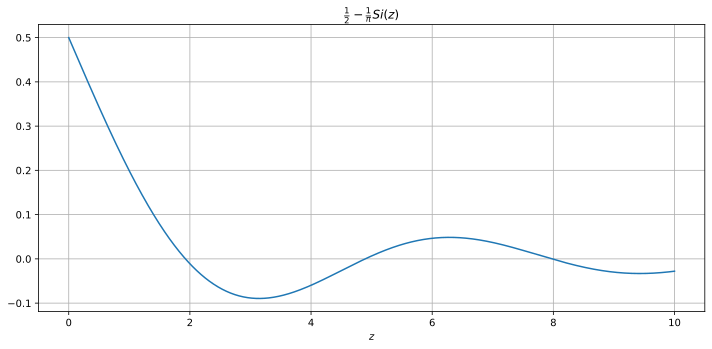

In [17]:
zs = np.linspace(0, 10, 1000)

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(zs, 1 / 2 - 1 / np.pi * sc.special.sici(zs)[0])

ax.grid(True)
ax.set_xlabel('$z$')
ax.set_title(r'$\frac{1}{2} - \frac{1}{\pi}Si(z)$')
fig.tight_layout()
plt.show()

At $z = 0$ we obtain behavior at the discontinuity point — by Dirichlet's theorem, the Fourier series convergence occurs exactly to the half-sum of the boundary values. However, with increasing $z$, the residual should tend to zero. Its deviation in the smaller direction means that the Fourier series "overshoots" beyond the true value of the function. As a consequence, we are interested in the first extremum of the expression under the modulus:
$$
\frac{d (\frac{1}{2} - \frac{1}{\pi}Si(z))}{dz} = 0 \iff z = \pi k \rightarrow max |\frac{1}{2} - \frac{1}{\pi}Si(z))| \approx 0.0895 
$$

Total, we obtain that the maximum residual of the jump function and its Fourier series is achieved at point $z = \pi \iff t = \frac{T}{2N}$ and the approximation error is $\frac{0.0895T}{T} \approx 9\%$. 

For any signal with a finite discontinuity of the first kind of magnitude $J$:
1.  The Fourier series does not converge uniformly in the vicinity of the discontinuity.
2.  Partial sums $S_N(t)$ form an overshoot immediately before and after the jump.
3.  As $N \to \infty$, the width of the overshoot tends to zero, but its amplitude tends to a constant value:
    $$ \Delta_{Gibbs} \approx 0.09 \cdot |J| $$
    That is, the amplitude of the "ringing" is always **about 9% of the magnitude of the full jump** of the function at this point.

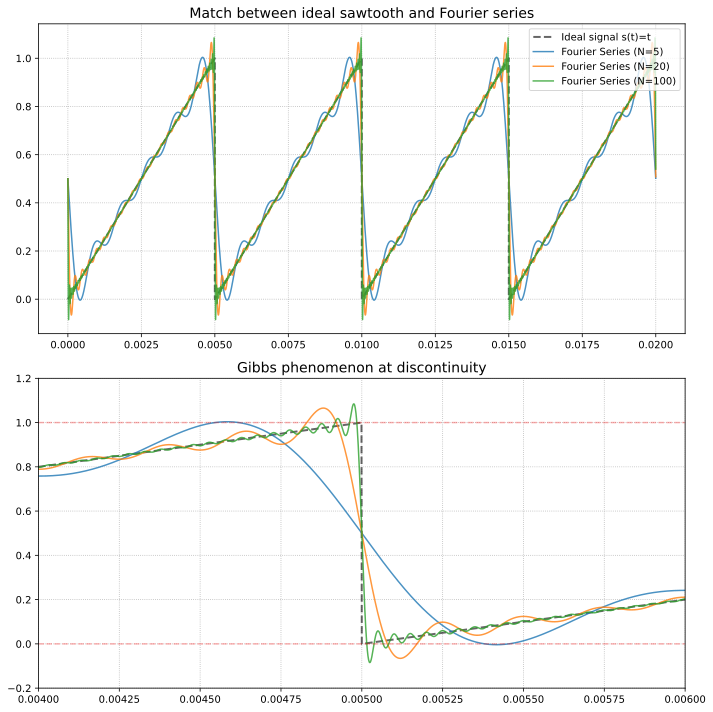

True signal


Gibbs error


Approximation, n=1


Approximation, n=5


Approximation, n=20


Approximation, n=100


In [18]:

def get_consistent_sawtooth(N, T, duration, sr):
    ts = np.linspace(0, duration, int(sr * duration), endpoint=False)
    
    reconstruction = np.zeros_like(ts)
    for n in range(1, N + 1):
        reconstruction += np.sin(n * 2 * np.pi / T * ts) / n
        
    return ts, 1 / 2 - (1.0 / np.pi) * reconstruction

T_period, duration, sr = 1.0 / 200, 0.02, 10 ** 6
ts_fine = np.linspace(0, duration, int(sr * duration), endpoint=False)
ideal_signal = (ts_fine % T_period) / T_period

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

ax1.plot(ts_fine, ideal_signal, 'k--', label='Ideal signal s(t)=t', alpha=0.6, lw=2)
ax2.plot(ts_fine, ideal_signal, 'k--', alpha=0.6, lw=2)

for n, col in zip([5, 20, 100], ['#1f77b4', '#ff7f0e', '#2ca02c']):
    ts, reconstruction = get_consistent_sawtooth(n, T_period, duration, sr)
    ax1.plot(ts, reconstruction, label=f'Fourier Series (N={n})', color=col, alpha=0.8)
    ax2.plot(ts, reconstruction, color=col, alpha=0.8)

ax1.set_title('Match between ideal sawtooth and Fourier series', fontsize=14)
ax1.legend(loc='upper right')
ax1.grid(True, ls=':')

ax2.set_xlim(T_period - 0.001, T_period + 0.001)
ax2.set_ylim(-0.2, 1.2)
ax2.set_title('Gibbs phenomenon at discontinuity', fontsize=14)
ax2.axhline(1.0, color='red', ls='--', alpha=0.3)
ax2.axhline(0.0, color='red', ls='--', alpha=0.3)
ax2.grid(True, ls=':')

plt.tight_layout()
plt.show()

duration, sr = 2.0, 44100

t_audio = np.linspace(0, duration, int(duration * sr), endpoint=False)
true_audio = (t_audio % T_period) / T_period
_, approx_audio = get_consistent_sawtooth(100, T_period, duration=duration, sr=sr)
diff_audio = true_audio - approx_audio
print('True signal')
display(Audio(true_audio, rate=sr))
print('Gibbs error')
display(Audio(diff_audio, rate=sr))    

for n in [1, 5, 20, 100]:
    _, sig_audio = get_consistent_sawtooth(n, T_period, duration=duration, sr=sr)
    audio_to_play = sig_audio - 0.5
    audio_to_play /= np.max(np.abs(audio_to_play))
    audio_to_play *= 0.5
    print(f'Approximation, n={n}')
    display(Audio(audio_to_play, rate=sr))

### `Discretization of Analog Signal. Aperture Effect`

Now, let's return to the connection between the analog signal and its discrete restriction:
$$
s_{d}(t) = s(t) * ш_{T}(t)
$$

Consider discretization through a "real" lattice function with rectangular pulses.

Let:
*   $T$ — observation period.
*   $N$ — number of samples.
*   $\Delta t = \frac{T}{N}$ — sampling step.
*   $\tau$ — square wave pulse width (integration time of one sample), usually $\tau \le \Delta t$.

Then, 
$$
s[n] = \frac{1}{\tau} \int_{t_n - \tau/2}^{t_n + \tau /2} s(t) \, dt \;,\; t_n = n \Delta t
$$

Decomposition of the original signal into Fourier series: $s(t) = \sum_{n=-\infty}^{\infty} s_n e^{-j \frac{2\pi}{T} nt}$.

Substitute this into the formula for $s[n]$:
$$ s[n] = \frac{1}{\tau} \int_{t_n - \tau/2}^{t_n + \tau/2} \left( \sum_{k=-\infty}^{\infty} s_k e^{-j \frac{2\pi}{T} kt} \right) dt $$

Swap the sum and integral and calculate the integral for one exponential:

$$
\int_{t_n - \tau/2}^{t_n + \tau/2} e^{-j \frac{2\pi}{T} kt} dt = ... = \tau e^{-j w_k t_n} \frac{sin(w_k\tau / 2)}{w_k \tau / 2} = \tau e^{-j w_k t_n} sinc(w_k\tau / 2) = \tau e^{-j w_k t_n} sinc(\pi\frac{k\tau}{T}), w_k = \frac{2\pi}{T}k
$$

Substituting into the original expression:
$$
s[n] = \sum_{k=-\infty}^{\infty} s_k sinc(w_k \tau/2) e^{-jw_k t_n} =  \sum_{k=-\infty}^{\infty} \hat{s_k} e^{-jw_k t_n} = \hat{s}(t)
$$

Compare this expression with ideal discretization of an analog signal:
$$
s_{\text{ideal}}[n] = \sum_{k=-\infty}^{\infty} s_k e^{-j w_k t_n}
$$

Thus, non-ideal discretization is the ideal discretization of **another** analog signal whose Fourier coefficients are smoothed over frequency: 
$$
\hat{s_k} = s_{k} sinc(w_k \tau / 2)
$$

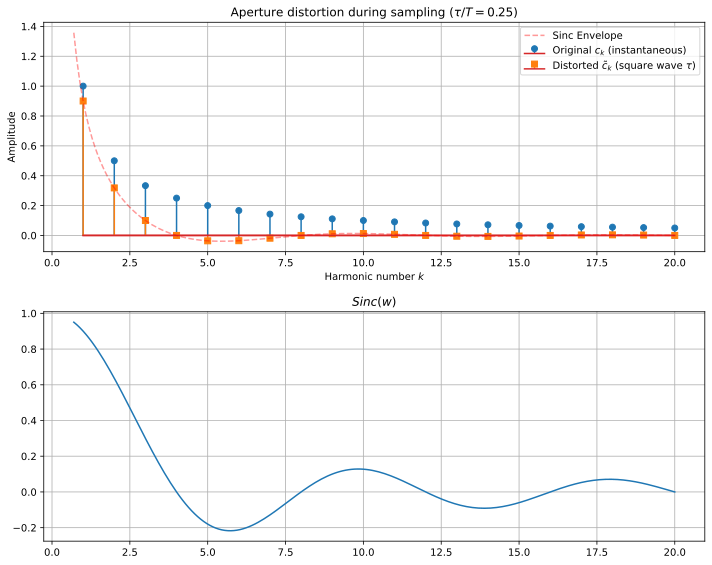

In [19]:
T, tau, N = 1.0, 0.25, 20

ns = np.arange(1, N + 1)

Sn = 1.0 / ns
Sn_tilde = Sn *  np.sinc(ns * tau / T)

fig, axes = plt.subplots(2, 1, figsize=(10, 8))
axes[0].stem(ns, Sn, linefmt='C0-', markerfmt='C0o', label='Original $c_k$ (instantaneous)')
axes[0].stem(ns, Sn_tilde, linefmt='C1-', markerfmt='C1s', label='Distorted $\\tilde{c}_k$ (square wave $\\tau$)')

ns_fine = np.linspace(0.7, N, 200)
axes[0].plot(ns_fine, 1 / ns_fine * np.sinc(ns_fine * tau / T), 'r--', alpha=0.4, label='Sinc Envelope')

axes[1].plot(ns_fine, np.sinc(ns_fine * tau / T))

axes[0].set_title(f'Aperture distortion during sampling ($\\tau/T = {tau/T}$)')
axes[1].set_title(f'$Sinc(w)$')
axes[0].set_xlabel('Harmonic number $k$')
axes[0].set_ylabel('Amplitude')
axes[0].legend()
axes[0].grid(True)
axes[1].grid(True)
fig.tight_layout()
plt.show()

Obviously, the zeros of $Sinc(w)$ coincide with the zeros of $sin(w)$. From the shape of the graph, it is clear that:
1. Higher frequencies are suppressed more strongly as a result of discretization.
2. Frequencies corresponding to zeros of $sin(w)$ are lost completely.
3. Depending on the sampling rate, low frequencies are almost unchanged.

That is, discretization causes a transformation that can be called a **Low Pass Filter**.

### `Zero-Order Hold`

Let's analyze an example. Let:
* Sampling frequency $\Delta f = 44100 Hz$
* Averaging for discretization occurs over the entire sample period $\tau = \frac{1}{\Delta f} \approx 23 ms$

The first zero of $Sinc(\frac{2\pi}{T}k\tau/2)$ is at $\frac{2\pi}{T}k\tau / 2 = \pi \Rightarrow f_0 = \frac{k_0}{T} = \frac{1}{\tau} = 44100Hz$. That is, with this approach, we preserve all frequencies that we could recover simply from the conditions of the Nyquist Theorem!

Moreover, due to aliasing, we lose information about frequencies above $\frac{f}{2} = 22050 Hz$ in any case.

However, it is interesting to understand how strongly discretization affects low frequencies. 

The attenuation coefficient can be written as:
$$
A(f_k) = Sinc(\pi\frac{k\tau}{T}) = Sinc(\pi\frac{f_k}{f})
$$

Consider canonical cases:
1. Low frequencies: $f_k \approx 100Hz \Rightarrow A(f_k) \approx 0.9999 \Rightarrow L_{dB} = 20\log_{10}(\frac{A(f_k)}{1}) \approx 0dB$
2. Mid frequencies: $f_k \approx 1kHz \Rightarrow A(f_k) \approx 0.9991 \Rightarrow L_{dB} \approx -0.008dB$
3. Audible limit: $f_k \approx 20kHz \Rightarrow A(f_k) \approx 0.695 \Rightarrow L_{dB} \approx -3.16dB$

We obtain that if we record sound on a computer and send it to speakers without transformations, we will hear a distorted version with "rolled off" frequencies!

Fortunately, in the modern world, this problem is solved due to the fact that audio chips operate at frequencies tens of times higher than the audible threshold.

### `Anti-aliassing effect` 

But is there any benefit from discretization? Turns out there is!

Recall that when calculating DFT, the resulting coefficients mix mirrored and multiple frequencies:
$$
S[m] = \sum\limits_{r=-\infty}^{\infty} \hat{s_{m + rN}} = s_m sinc\big(\pi \frac{m\tau}{T}\big) + \sum\limits_{r\ne0} s_{m + rN} sinc\Big(\pi \frac{(m + rN)\tau}{T}\Big)
$$

The first term in the expression for the DFT spectrum describes the useful signal, while the second term is responsible for parasitic aliasing tails.

At the same time, the larger $\tau\frac{(m + rN)\tau}{T}$ is, the more strongly parasitic frequencies are suppressed. Let's analyze with an example of a video signal.

Suppose we are filming a fast-rotating fan with a camera:
* Rotation frequency $f_{s} = 2.2Hz \Rightarrow T \approx 0.45s$
* Sampling frequency $f = 2Hz$ — two frames per second
* Exposure time $\tau = 0.5s$ — coincides with the sampling period

When performing ideal discretization, DFT cannot extract frequencies higher than the sampling frequency; instead, a parasitic frequency at $0.2Hz$ will appear (as well as a coinciding mirror one at $1.8Hz$). Now, instead of a fast-rotating fan, we will see a slowly rotating one.

When switching to discretization using a square wave, all frequencies of the analog signal will be passed through a low-pass filter, in particular for the carrier frequency:
$$
A(f_{s}) = |sinc(\pi \frac{f_{s}}{f})| \approx 0.0894 \Rightarrow L_{dB} \approx -21dB
$$

During those $0.5$ seconds while the camera shutter is open, the fan manages to make $1.1$ revolutions (one full circle + another $10\%$ of a circle). The whole circle "blurred" into a uniform gray background. Only the "extra" $10\%$ of movement remained visible.

In [20]:
from plt_utils import animate_antialiasing

HTML(animate_antialiasing().to_html5_video())

An attentive reader might ask, how is Motion Blur better than aliasing? From a practical point of view:
* In audio: What would you prefer? For the sound to be slightly less "bright" (soft sinc blur), or for extraneous wheezes to appear in the music that were not in the original (aliasing)?
* In video: What is better? Slightly blurred wheel spokes during movement (Motion Blur) or a wheel that clearly spins backward, while a rainbow pattern shimmers on the announcer's jacket (Moiré/Aliasing)?

In practice, aliasing is tried to be avoided, as it is an irreversible introduction of false information, whereas discretization does not lose information, but only changes its scale (with the exception of zeros of $Sinc$, which, however, in practice are located beyond the highest useful frequency).

## $l^2$ `(Infinite/Aperiodic Discrete Signals). Discrete-Time Fourier Transform`

In all previous cases, the signal spectrum turned out to be either finite or countable. However, can the spectrum be continuous? To answer this question, let's move to aperiodic discrete signals.

Here we face the fact that writing out a trigonometric basis for this space is not possible — such functions will be guaranteed to be quadratically non-integrable. Instead, we will do the following trick. Consider a sequence of spaces $\mathbb{C}^{N}$ nested in $l^{2}$.

Consider an arbitrary signal $s[n]$ from $\mathbb{C}^{N}$. Write its representation in the form of a Fourier Series (**synthesis**) and inverse transformation (**analysis**):
$$
s[n] = \frac{1}{\sqrt{N}} \sum\limits_{k=0}^{N-1} S[k] e^{-j\frac{2\pi}{N}nk}
$$
$$
S[k] = \frac{1}{\sqrt{N}} \sum\limits_{n=0}^{N-1} s[n] e^{j\frac{2\pi}{N}nk}
$$

Consider the limit transition $N \rightarrow \infty$. 

Let $w_{k} = \frac{2\pi k}{N} \Rightarrow \Delta w = \frac{2\pi}{N}$

Obtain the synthesis formula:
$$
s[n] = \sqrt{\frac{\Delta w}{2 \pi}} \sum\limits_{k=0}^{N-1} S[k] e^{-jw_{k}n} = \sum\limits_{k=0}^{N-1} \Bigg[\frac{S[k]}{\sqrt{\Delta w}\sqrt{2 \pi}}\Bigg] e^{-jw_{k}n} \Delta w
$$

Define formally periodic functions $S(e^{jw}) = \frac{1}{\sqrt{2\pi}}\sum\limits_{n=-\infty}^{\infty} s[n] e^{jwn}$, $S_{N}(e^{jw}) = \frac{1}{\sqrt{2\pi}}\sum\limits_{n=0}^{N - 1} s[n] e^{jwn}$ — **DTFT (Discrete-Time Fourier Transform)**. This expression means that the function is defined not just on arbitrary values of the variable, but on the complex circle and it has periodic properties.

#### `Connection with DFT`

Comparing DTFT with the analysis formula, one can notice that $S_{N}(e^{jw_{k}}) = \frac{1}{\sqrt{2\pi}}\sum\limits_{n=0}^{N-1} s[n] e^{jw_{k}n} = \sqrt{\frac{N}{2\pi}} S[k]$. That is, DTFT is a continuous extension of the discrete spectrum of a finite signal. And conversely, the spectrum of a finite signal is determined as the discretization of some continuous spectrum of a "real" aperiodic signal. Moreover, the more samples of the original signal we consider, the more accurately the DFT approximates the true spectrum of the "real" aperiodic signal.

Formally integrate this expression:
$$
\int\limits_{0}^{2\pi} S(e^{jw}) e^{-jwm}dw = \int\limits_{0}^{2\pi} \frac{1}{\sqrt{2\pi}}\sum\limits_{n=-\infty}^{\infty} s[n] e^{jwn} e^{-jwm}dw
$$

Assuming uniform convergence $S_{N}(e^{jw}) \overset{N \rightarrow \infty}{\longrightarrow} S(e^{jw})$, we can swap summation and integration:
$$
\int\limits_{0}^{2\pi} S(e^{jw}) e^{-jwm}dw = \frac{1}{\sqrt{2\pi}}\sum\limits_{n=-\infty}^{\infty} s[n] \int\limits_{0}^{2\pi} e^{jw(n - m)}dw = \begin{cases} \sqrt{2\pi} s[m],& n=m\\ 0,& n\ne m \end{cases}
$$

Thus we obtain the synthesis formula:
$$
s[n] = \frac{1}{\sqrt{2\pi}} \int\limits_{0}^{2\pi} S(e^{jw}) e^{-jwn}dw
$$

An attentive reader once again might ask, when will uniform convergence $S_{N}(e^{jw_{k}})$ be satisfied in $l^{2}$? 

1. If $s[n]$ is absolutely summable, then convergence is obvious.
2. We can forgo uniform convergence and limit ourselves to convergence in the mean: $\int_{0}^{2\pi}|S(e^{jw}) - S_{N}(e^{jw})|^{2}dw \overset{N \rightarrow \infty}\longrightarrow 0$. In this case, the spectrum can be discontinuous.

Thus, we established a connection between spaces $L^{2}[a, b]$ and $l^{2}$:
1. Decomposition into Fourier series of a signal from $L^{2}[a, b]$ returns a discrete infinite spectrum.
2. DTFT for a signal from $l^{2}$ returns a periodic spectrum.

<table style="border-collapse:collapse;border-spacing:0" class="tg"><thead><tr><th style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Signal</th><th style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Transformation</th><th style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Analysis</th><th style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Synthesis</th></tr></thead>
<tbody><tr><td style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Infinite discrete (aperiodic) $s[n] \in l^2$</td><td style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">DTFT (Discrete-Time Fourier Transform)</td><td style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">$$S(e^{j \omega}) = \frac{1}{\sqrt{2\pi}} \sum_{n=-\infty}^{\infty} s[n] e^{-j \omega n}$$</td><td style="border-color:inherit;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:right;vertical-align:top;word-break:normal">$$s[n] = \frac{1}{\sqrt{2\pi}} \int_{0}^{2\pi} S(e^{j \omega}) e^{j \omega n} d\omega$$</td></tr></tbody></table>

Just as before, the product of coefficients before the formulas should be $\frac{1}{2\pi}$, and the minus sign in the exponent can stand in exactly one of the two formulas.

### $s[n] = \delta[n]$

Let:
$$
s[n] = \begin{cases} 1, &n = 0 \\ 0, &n\ne 0\end{cases}
$$

Then:
$$
S(e^{jw}) = \frac{1}{\sqrt{2\pi}} e^{-jw0} = \frac{1}{\sqrt{2\pi}}
$$

That is, the spectrum of an infinitely short impulse is a constant (white noise). All frequencies are present with equal amplitude.

### $s[n] = \delta[n - k]$

$$
S(e^{jw}) = \frac{1}{\sqrt{2\pi}} e^{-jwn}
$$

A shift in time does not change the amplitude of the spectrum but adds a linear phase shift. This property is obviously true for any shifted signal!

### `Boxcar function`

$$
s[n] = \begin{cases} 1, &|n| \le M \\ 0, &\text{othewise}\end{cases}
$$

$$
S(e^{jw}) = \frac{1}{\sqrt{2\pi}} \sum\limits_{n=-\infty}^{\infty} s[n]e^{-jwn} = \frac{1}{\sqrt{2\pi}} \sum\limits_{n=-M}^{M} e^{-jwn}
$$

By the geometric progression formula:
$$
S(e^{jw}) = \frac{1}{\sqrt{2\pi}} \sum\limits_{n=-M}^{M} (e^{-jw})^n = \frac{1}{\sqrt{2\pi}} \frac{e^{-jw(-M)} - e^{-jw(M+1)}}{1 - e^{-jw}} = \{\times e^{jw/2}\} = \frac{1}{\sqrt{2\pi}} \frac{e^{jw(M + 1/2)} - e^{-jw(M+1/2)}}{e^{jw/2} - e^{-jw/2}} = \frac{1}{\sqrt{2\pi}} \frac{sin((M + 1/2)w)}{sin(w/2)}
$$

Note: $N = 2M + 1$. Therefore:
$$
S(e^{jw}) = \frac{1}{\sqrt{2\pi}} \frac{sin(Nw/2)}{sin(w/2)} = D_N(w)\;\textbf{-- Dirichlet Kernel}
$$

One can notice the similarity of the Dirichlet Kernel with the $Sinc(w)$ function — around zero both functions have the same behavior, up to a constant multiplier; however, **the Dirichlet Kernel is the periodic analog** of $Sinc(w)$.

Properties of the Dirichlet Kernel:
    
1. $\sqrt{2\pi} \lim\limits_{w\rightarrow 0} D_{N}(w) = \{\text{L'Hôpital's Rule}\} = N$
2. The kernel is periodic with period $2\pi$
3. Zeros coincide with zeros of the sine: $w_{k} = \frac{2\pi}{N}k$

<b style='color:red;'>What will the Dirichlet Kernel look like for a non-symmetric signal defined from $0$ to $N - 1$?</b>

<details><summary>Answer:</summary>>> A phase multiplier $e^{-jw\frac{N - 1}{2}}$ will appear in the spectrum.</details>

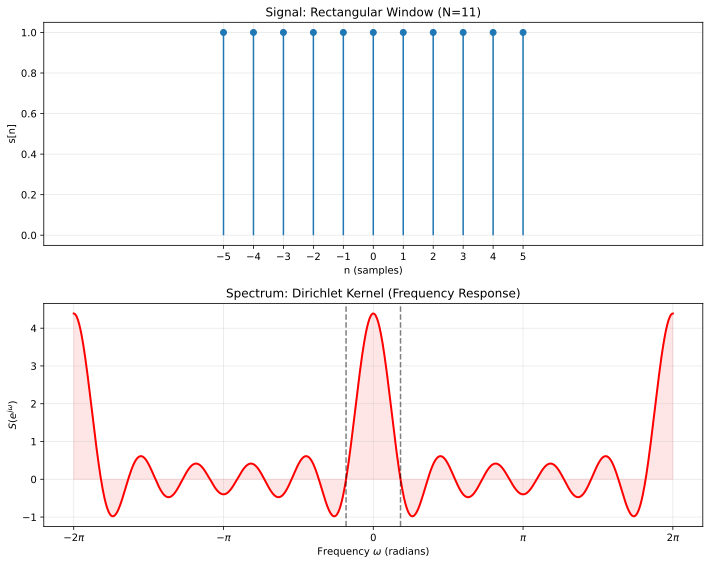

In [21]:
N = 11
M = (N - 1) // 2
n = np.arange(-M, M + 1)
w_n = np.ones(N)

omega = np.linspace(-2 * np.pi, 2 * np.pi, 1000)

with np.errstate(divide='ignore', invalid='ignore'):
    dirichlet = np.sin(N * omega / 2) / np.sin(omega / 2)
    dirichlet[omega == 0] = N
    dirichlet[np.isclose(np.sin(omega/2), 0)] = N * np.sign(np.cos(M * omega))[np.isclose(np.sin(omega/2), 0)]
    dirichlet /= np.sqrt(2 * np.pi)
    
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

ax1.stem(n, w_n, basefmt=" ")
ax1.set_title(f'Signal: Rectangular Window (N={N})')
ax1.set_xlabel('n (samples)')
ax1.set_ylabel('s[n]')
ax1.set_xlim(-N, N)
ax1.grid(True, alpha=0.3)
ax1.set_xticks(n)

ax2.plot(omega, dirichlet, 'r', lw=2, label=r'$D_N(\omega)$')
ax2.fill_between(omega, dirichlet, color='red', alpha=0.1)

ax2.set_title('Spectrum: Dirichlet Kernel (Frequency Response)')
ax2.set_xlabel('Frequency $\omega$ (radians)')
ax2.set_ylabel('$S(e^{j\omega})$')
ax2.grid(True, alpha=0.3)

ticks = [-2*np.pi, -np.pi, 0, np.pi, 2*np.pi]
labels = [r'$-2\pi$', r'$-\pi$', '0', r'$\pi$', r'$2\pi$']
ax2.set_xticks(ticks)
ax2.set_xticklabels(labels)

ax2.axvline(2*np.pi/N, color='k', linestyle='--', alpha=0.5)
ax2.axvline(-2*np.pi/N, color='k', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

### `Convolution Theorem`

Similar to previous cases, the main result of frequency analysis is the Convolution Theorem!

**Definition (Linear convolution):**
For signals $f[n], g[n] \in l^2$, convolution is defined as:
$$h[n] = (f * g)[n] = \sum_{k=-\infty}^{\infty} f[k]g[n-k]$$

**Theorem:**
If $h[n] = (f * g)[n]$, then its DTFT is $H(e^{j\omega}) = \sqrt{2\pi} \cdot F(e^{j\omega}) \cdot G(e^{j\omega})$.

**Proof:**
Use the analysis formula:
1. Write $H(e^{j\omega})$:
   $$H(e^{j\omega}) = \frac{1}{\sqrt{2\pi}} \sum_{n=-\infty}^{\infty} \left( \sum_{k=-\infty}^{\infty} f[k]g[n-k] \right) e^{-j\omega n}$$
   

2. Change the order of summation:
   $$H(e^{j\omega}) = \frac{1}{\sqrt{2\pi}} \sum_{k=-\infty}^{\infty} f[k] \left( \sum_{n=-\infty}^{\infty} g[n-k] e^{-j\omega n} \right)$$

3. Introduce substitution in the inner sum: $m = n-k \Rightarrow n = m+k$:
   $$H(e^{j\omega}) = \frac{1}{\sqrt{2\pi}} \sum_{k} f[k] e^{-j\omega k} \sum_{m} g[m] e^{-j\omega m}$$

4. Note that each sum is a DTFT up to a multiplier $\frac{1}{\sqrt{2\pi}}$.
   $$H(e^{j\omega}) = \sqrt{2\pi} F(e^{j\omega}) G(e^{j\omega}) \quad \blacksquare$$

It is not difficult to show the dual version of the theorem:
$$
h[n] = f[n]g[n] \iff H(e^{jw}) = \frac{1}{\sqrt{2\pi}}(F * G)(e^{jw})
$$

It can be noticed that in all three cases ($\mathbb{C}^{N}, L^{2}[a, b], l^{2}$), the structure of the Convolution Theorem, as well as its proof, has the same form: 

**Spectrum of convolution = (Normalization constant) × Product of spectra.**

<b style='color:red;'>But why does this happen?</b>

<details><summary>Answer:</summary>>> The answer to this question turns out to be indecently complex. For all interested, key words to dive in: commutative shift groups, Pontryagin Duality, Haar measure normalization.</details>

### `Spectral Leakage`

[Still] an attentive listener might notice that infinite signals do not exist in computers, and we always work with a finite fragment of an infinite discrete signal. Let's consider how the spectrum changes when restricting the window.

Let $s[n] \in l^{2}$. The transition from an infinite signal to a finite one is equivalent to multiplying the signal by a window function:
$$
s_{w}[n] = s[n] w[n],\quad w[n] = \begin{cases} 1, & |n| \le M\\ 0, &\text{othewise} \end{cases}
$$

To find the spectrum of the windowed signal, we can use the Convolution Theorem and the Dirichlet Kernel. Note that we want to calculate the spectrum using the **dual Convolution Theorem**:
$$
S_N(e^{jw}) = \frac{1}{\sqrt{2\pi}}\int\limits_{0}^{2\pi} S(e^{j\theta}) D_N(w - \theta) d\theta = \frac{1}{2\pi} \int_{0}^{2\pi} S(e^{j\theta}) \frac{\sin(N(\omega - \theta)/2)}{\sin((\omega - \theta)/2)} d\theta
$$

This formula shows that the observed spectrum $S_N$ is not the true spectrum $S$, but its "blurred" version. Energy from each frequency point $\theta$ "leaks" into the vicinity according to the shape of the Dirichlet kernel.

Consider a particular generalized case. Here, we formally take a periodic signal that does not lie in $l^{2}$, however, this example is extremely illustrative.

Consider the limiting case when the spectrum is defined only at one point:

Let $s[n] = e^{j\omega_0 n}$ (ideal infinite tone). Its true spectrum is a delta function: $S(e^{jw}) = \sqrt{2\pi} \delta(w - \omega_0)$.

Then the observed spectrum:
$$S_N(e^{j\omega}) = \frac{1}{\sqrt{2\pi}} \int_{0}^{2\pi} \sqrt{2\pi} \delta(\theta - \omega_0) D_N(\omega - \theta) d\theta = D_N(\omega - \omega_0)$$

Instead of an infinitely narrow line, we see a Dirichlet Kernel centered at $\omega_0$. 

As a result, for each spectral band, the limited signal will receive **two components of "leakage"**:
1.  **Main Lobe Expansion:**
    The width of the central peak of the Dirichlet kernel is $\Delta \omega \approx \frac{4\pi}{N}$. This means that any spectral feature is "smeared" by this amount. 
    *   *Consequence:* If the signal has two frequencies $\omega_1$ and $\omega_2$ such that $|\omega_1 - \omega_2| < \frac{2\pi}{N}$, their spectral peaks will merge, and we will not be able to distinguish them. **Leakage limits resolution.**

2.  **Side Lobes Appearance:**
    The Dirichlet Kernel has "tails" that decay very slowly (like $1/\omega$). 
    *   *Consequence:* Energy of a strong signal at frequency $\omega_1$ "leaks" to other frequencies through side lobes. If there is a weak signal at frequency $\omega_2$, it will be completely masked by the "leaked" energy of the strong signal.

Spectral leakage effect is a direct consequence of **limited observation time**. 

From the point of view of $l^2$:
*   The windowing operation is a projection of an infinite signal onto a finite-dimensional subspace. 
*   Since the rectangular window has "sharp" edges in the time domain, its Fourier image (Dirichlet Kernel) has "long tails" in the frequency domain.

Consider an arbitrary signal $s[n]$ with a finite (discrete) spectrum $\{w_{n}\}$. Despite the fact that such a signal belongs to $l^{\infty}$, and not $l^{2}$, one can formally consider the DTFT extension of the spectrum of this signal:
$$
S(e^{jw}) = \sqrt{2\pi}\sum\limits_{n=-\infty}^{\infty} S[n] \delta(w - w_n)
$$

Obviously, such a signal will be periodic with some period $P$: $w_{n} = \frac{2\pi}{P}n$.

Transitioning back to the restriction of an infinite periodic signal to an arbitrary interval:
$$
s_N[n] = s[n] w_N[n] \Rightarrow S_{w}(e^{jw}) = \frac{1}{\sqrt{2\pi}} \int\limits_{0}^{2\pi}S(e^{j\theta})D_N(w - \theta)d\theta = \frac{1}{\sqrt{2\pi}} \int\limits_{0}^{2\pi} \Bigg[ \sqrt{2\pi} \sum\limits_{n=-\infty}^{\infty} S[n] \delta(\theta - w_n) \Bigg] D_N(w - \theta)d\theta
$$

Integrate using the filtering property of the $\delta$-function:
$$
S_w(e^{jw}) = \sum\limits_{n=-\infty}^{\infty} S[n] D_N(w - w_n)
$$

The continuous spectrum of a windowed signal is a sum of shifted Dirichlet Kernels. Each "ideal" frequency $w_n$ is now surrounded by a "halo" of side lobes.

Thus, the transition from a periodic discrete signal with a finite spectrum to a finite signal introduces distortions associated with the Dirichlet kernel. Compare the DFT coefficients of the signal $s_{N}[n]$ with its true spectrum $S[n]$.

In the case of DFT, the spectrum is defined on a uniform grid: $\Omega_k = \frac{2\pi}{N}k$. Consequently:
$$
S_N[k] = \sqrt{2\pi} S_{w}(e^{j\Omega_k}) = \sqrt{2\pi} \sum\limits_{n=-\infty}^{\infty} S[n] D_N(\Omega_k - w_n)
$$

**The final impact of signal restriction will depend on the relationship between grid nodes $\Omega_k$ and frequencies of the original signal spectrum $w_n$.**

1. Case "Integer number of periods", $N = m \times P$:

In this case, $w_{n}$ exactly coincides with one of $\Omega_k$. Consequently:
* At this point $S_N[k] = S[k]$.
* The argument of the Dirichlet Kernel $\frac{N}{2}(\Omega_k - w_{k}) = \pi(k - nm)$ is a multiple of $\pi$ and for all samples **the Dirichlet Kernel hit its zeros**.

As a result, the frequency will be recovered correctly. Leakage is absent.

2. Case "Non-integer number of periods"

If $w_n$ is between grid nodes $\Omega_k, \Omega_{k+1}$:
* The argument of the Dirichlet Kernel $\frac{N}{2}(\Omega_k - w_{k})$ is never a multiple of $\pi$.
* The numerator of the Kernel never turns to zero; as a consequence, harmonic $S[n]$ "leaked" into all bins of the spectrum.

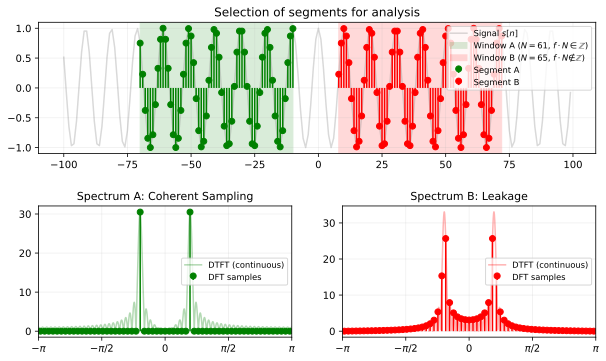

In [22]:
def dirichlet_kernel(omega, N):
    with np.errstate(divide='ignore', invalid='ignore'):
        val = np.sin(N * omega / 2) / np.sin(omega / 2)
    val[np.abs(np.remainder(omega + np.pi, 2 * np.pi) - np.pi) < 1e-10] = N
    return val / np.sqrt(2 * np.pi)

N1, N2 = 61, 65
M1, M2 = (N1 - 1) // 2, (N2 - 1) // 2

n_long = np.arange(-100, 100)
w0 = 2 * np.pi * 6 / 61 
s_long = np.cos(w0 * n_long)

center1, center2 = -40, 40
n1 = np.arange(center1 - M1, center1 + M1 + 1)
n2 = np.arange(center2 - M2, center2 + M2 + 1)

fig = plt.figure(figsize=(10, 9))
gs = plt.GridSpec(3, 2, hspace=0.4)

ax_time = fig.add_subplot(gs[0, :])
ax_time.plot(n_long, s_long, color='gray', alpha=0.3, label='Signal $s[n]$')
ax_time.axvspan(n1[0], n1[-1], color='green', alpha=0.15, label=f'Window A ($N={N1}$, $f \cdot N \in \mathbb{{Z}}$)')
ax_time.axvspan(n2[0], n2[-1], color='red', alpha=0.15, label=f'Window B ($N={N2}$, $f \cdot N \\notin \mathbb{{Z}}$)')
ax_time.stem(n1, s_long[np.isin(n_long, n1)], linefmt='g-', markerfmt='go', basefmt=" ", label='Segment A')
ax_time.stem(n2, s_long[np.isin(n_long, n2)], linefmt='r-', markerfmt='ro', basefmt=" ", label='Segment B')
ax_time.set_title("Selection of segments for analysis", fontsize=12)
ax_time.legend(loc='upper right', fontsize='small')
ax_time.grid(True, alpha=0.2)

omega_cont = np.linspace(-np.pi, np.pi, 2000)
def plot_spectrum(ax, N, color, title):
    S_cont = 0.5 * np.sqrt(2 * np.pi) * (
        dirichlet_kernel(omega_cont - w0, N) + 
        dirichlet_kernel(omega_cont + w0, N)
    )
    
    k = np.arange(-N // 2 + 1, N // 2 + 1)
    omega_dft = 2 * np.pi * k / N
    S_dft = 0.5 * np.sqrt(2 * np.pi) * (
        dirichlet_kernel(omega_dft - w0, N) + 
        dirichlet_kernel(omega_dft + w0, N)
    )
    
    ax.plot(omega_cont, np.abs(S_cont), color=color, alpha=0.3, label='DTFT (continuous)')
    ax.stem(omega_dft, np.abs(S_dft), linefmt=color, markerfmt='o', basefmt=" ", label='DFT samples')
    
    ax.set_title(title, fontsize=11)
    ax.set_xlim(-np.pi, np.pi)
    ax.set_xticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi])
    ax.set_xticklabels(['$-\pi$', '$-\pi/2$', '0', '$\pi/2$', '$\pi$'])
    ax.grid(True, alpha=0.2)
    ax.legend(fontsize='small')

plot_spectrum(fig.add_subplot(gs[1, 0]), N1, 'green', "Spectrum A: Coherent Sampling")
plot_spectrum(fig.add_subplot(gs[1, 1]), N2, 'red', "Spectrum B: Leakage")

plt.show()

## `Conclusion`

By this moment, we have been able to define periodic decompositions for all variations of signals, except for functions of a continuous argument defined on an unbounded interval.